#TAREA 1
Integrantes:
- SEQUEIROS ORTIZ EDUARDO JAIME
- MIRANDA HUARANCCA GUILLERMO MARIO
- HUARANCCA ÑAUPARI YONNY
- QUISOCALA MACHACA EDWARD


In [ ]:
import numpy as np
import pandas as pd
import cv2 as cv 
from google.colab.patches import cv2_imshow # for image display
from skimage import io
from PIL import Image 
import matplotlib.pylab as plt

from google.colab import drive
drive.mount('/content/drive')

import sys
import numpy
numpy.set_printoptions(threshold=sys.maxsize)


Mounted at /content/drive


## EJERCICIO 1: HISTEQ

Se crean funciones de apoyo para el HISTEQ

In [ ]:
def get_hist(arr_px, nbr_bins):
  arr = []
  nbr_bins = 256
  for i in range(0, 256):
    cont = 0
    for p in arr_px:
      if p == i:
        cont = cont + 1
    arr.append(cont)   
  return arr

def cumsum(arr_hist):
  arr_hist_response = []
  sum = 0 
  for i in range(0, len(arr_hist)):
    sum = sum + arr_hist[i] 
    arr_hist_response.append(sum)
  return arr_hist_response    

def max(arr_hist):
  max = 0
  for i in range(0, len(arr_hist)):
    if arr_hist[i] > max:
      max = arr_hist[i]
  return max    

def min(arr_hist):
  min = 256
  for i in range(0, len(arr_hist)):
    if arr_hist[i] < min:
      min = arr_hist[i]
  return min      

def divide(arr1, val):
  arr_r = []
  for i in range(0, len(arr1)):
    arr_r.append(arr1[i]/val)
  return  arr_r   

def multiply(arr1, val):
  arr_r = []
  for i in range(0, len(arr1)):
    arr_r.append(arr1[i]*val)
  return  arr_r   


IMAGEN ORIGINAL:


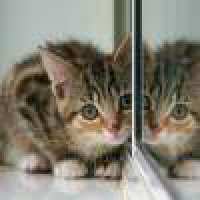

UTILIZANDO HISTEQ CON OPENCV


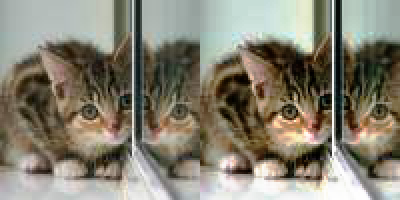

UTILIZANDO HISTEQ SIN OPENCV


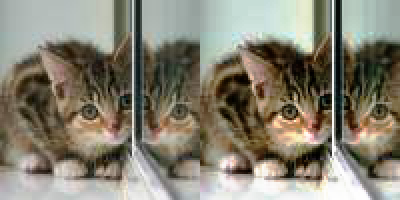

In [ ]:
#image = io.imread("/content/drive/My Drive/8bitmario.png") 
image = io.imread("https://placekitten.com/100/100") 
image_2 = cv.cvtColor(image, cv.COLOR_BGR2RGB)
print("IMAGEN ORIGINAL:")
cv2_imshow(cv.resize(image_2, None, fx=2, fy=2, interpolation = cv.INTER_NEAREST) )

def histeq(im, nbr_bins = 256):
  print('UTILIZANDO HISTEQ CON OPENCV')
  """ Histogram equalization of a grayscale image.  """
  # get the image histogram
  imhist, bins = np.histogram(im.flatten(), nbr_bins, [0, 256])
  cdf = imhist.cumsum() # cumulative distribution function
  cdf = imhist.max()*cdf/cdf.max()  #normalize
  cdf_mask = np.ma.masked_equal(cdf, 0)
  cdf_mask = (cdf_mask - cdf_mask.min())*255/(cdf_mask.max()-cdf_mask.min())
  cdf = np.ma.filled(cdf_mask,0).astype('uint8')
  return cdf[im.astype('uint8')]


def histeq_no_opencv(im, nbr_bins = 256):
  print('UTILIZANDO HISTEQ SIN OPENCV')
  imhist2 = get_hist(im.flatten(), nbr_bins)
  cdf2 = cumsum(imhist2)

  imhistx = numpy.asarray(imhist2)
  cdfx = numpy.asarray(cdf2)

  cdfx = multiply(divide(cdfx,max(cdfx)),max(imhistx))  #normalize
  cdfx_mask = np.ma.masked_equal(cdfx, 0)
  cdfx_mask = (cdfx_mask - min(cdfx_mask))*255/(max(cdfx_mask)-min(cdfx_mask))
  cdfx = np.ma.filled(cdfx_mask,0).astype('uint8')
  return cdfx[im.astype('uint8')]

#print(cdf)
im5 = histeq(image_2)
im5 = np.ma.filled(im5,0).astype('uint8')
#final_frame = cv.hconcat((im4, im5))
#cv2_imshow(cv.resize(im5, None, fx=10, fy=10, interpolation = cv.INTER_NEAREST))
final_frame = cv.resize(cv.hconcat((image_2, im5)), None, fx=2, fy=2, interpolation = cv.INTER_NEAREST) 
cv2_imshow(final_frame)


im6 = histeq_no_opencv(image_2)
im6 = np.ma.filled(im6,0).astype('uint8')
#final_frame = cv.hconcat((im4, im5))
#cv2_imshow(cv.resize(im6, None, fx=10, fy=10, interpolation = cv.INTER_NEAREST))
final_frame = cv.resize(cv.hconcat((image_2, im6)), None, fx=2, fy=2, interpolation = cv.INTER_NEAREST) 
cv2_imshow(final_frame)


## EJERCICIO 2: Combinación de imagenes 

Se definen las funciones

In [ ]:
def sum_matrix(mat_1, mat_2, func):
  mat_3 = np.array(mat_1, copy=True)   


  for i in range(0, len(mat_1)):
    for j in range(0, len(mat_1[i])):
      for k in range(0, len(mat_1[i,j])):
        tmp = 0
        mat_3[i,j,k] = tmp

        tmp = func(int(mat_1[i,j,k]), int(mat_2[i,j,k]))
        # tmp = int(int(mat_1[i,j,k]) + int(mat_2[i,j,k]))
        # if (tmp > 255):
        #    tmp = 255
        mat_3[i,j,k]  = tmp    
  return mat_3

def add_img(im1,im2, func, nbr_bins = 256, ):
  sum = sum_matrix(np.array(im1), np.array(im2), func)

  imgx23 = Image.fromarray(sum)
  imgx23.save("Image_from_array.png")
  imagex23 = io.imread("Image_from_array.png") 
  #image_3 = cv.cvtColor(image, cv.COLOR_BGR2RGB)

  cv2_imshow(imagex23)

### R(x,y):= A(x,y) + B(x,y)

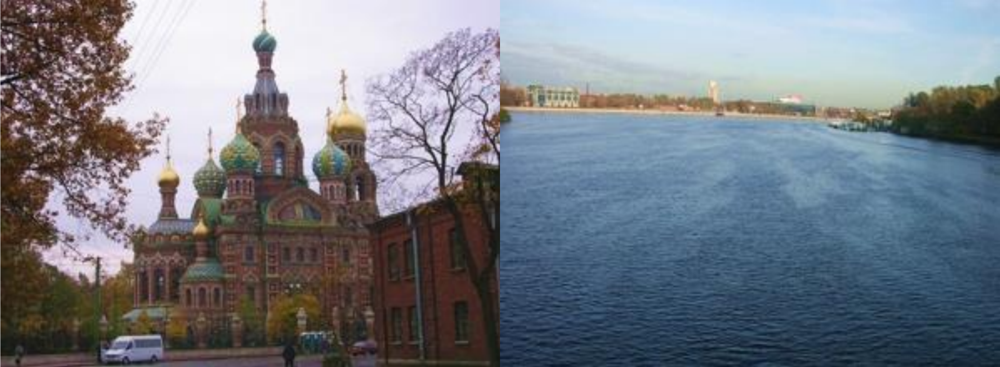

CON OPEN CV


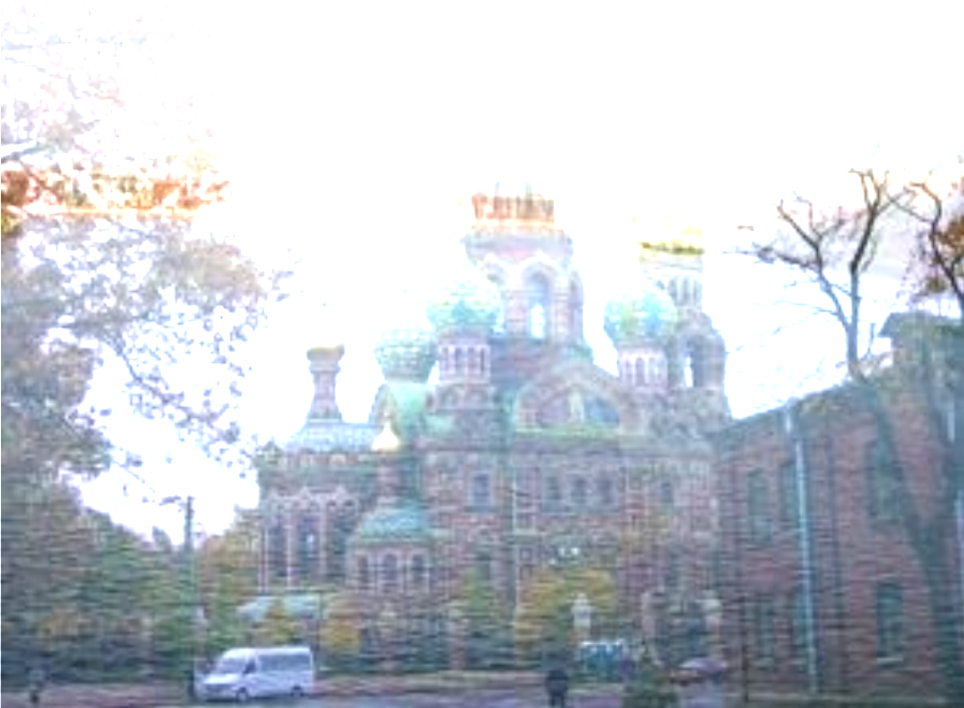

SIN OPENCV


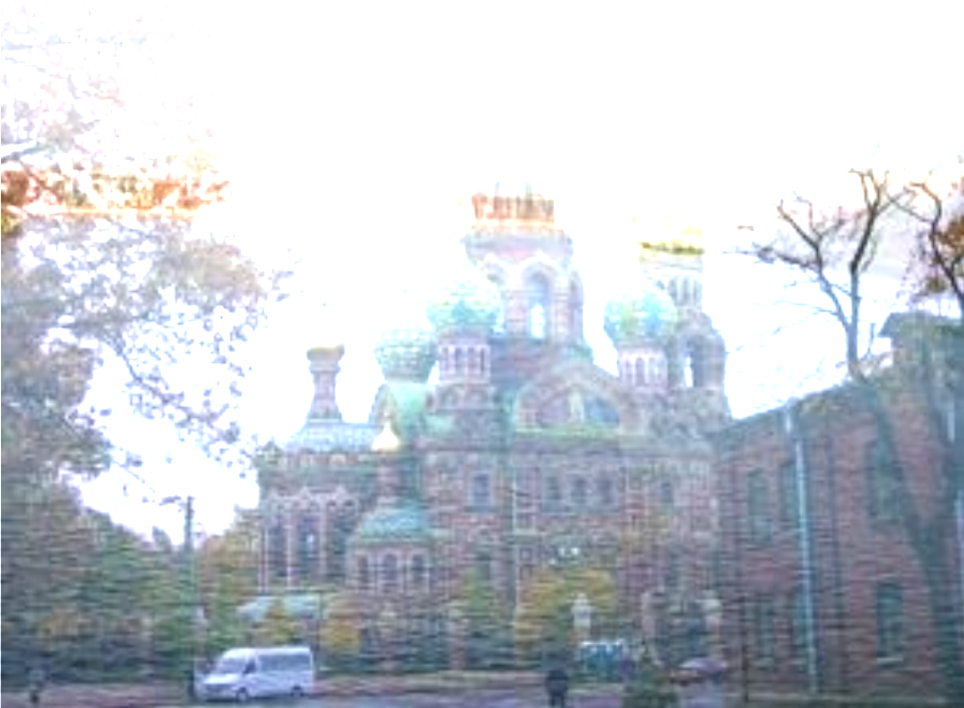

In [ ]:
def add_px(px_a, px_b):
  tmp = int(int(px_a) + int(px_b))
  if (tmp > 255):
    tmp = 255
  if (tmp < 0):
    tmp = 0
  return tmp        
 

image = io.imread("/content/drive/My Drive/24A_H.png") 
image_1 = cv.cvtColor(image, cv.COLOR_BGR2RGB)
image = io.imread("/content/drive/My Drive/24B_H.png") 
image_2 = cv.cvtColor(image, cv.COLOR_BGR2RGB)

cv2_imshow(cv.hconcat((image_1, image_2)))

# Add the images
print('CON OPEN CV')
img = cv.add(image_1, image_2)
  
# Show the image
cv2_imshow(img)

print('SIN OPENCV')
add_img(image_1,image_2, add_px)

### R(x,y):= A(x,y) - B(x,y)

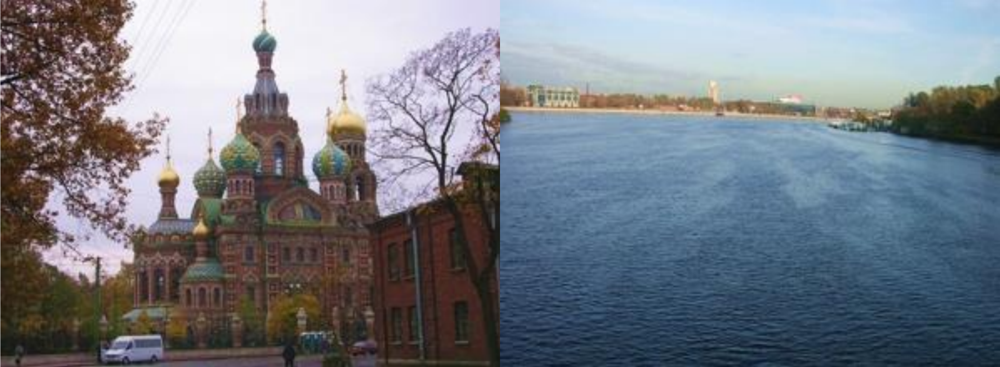

CON OPEN CV


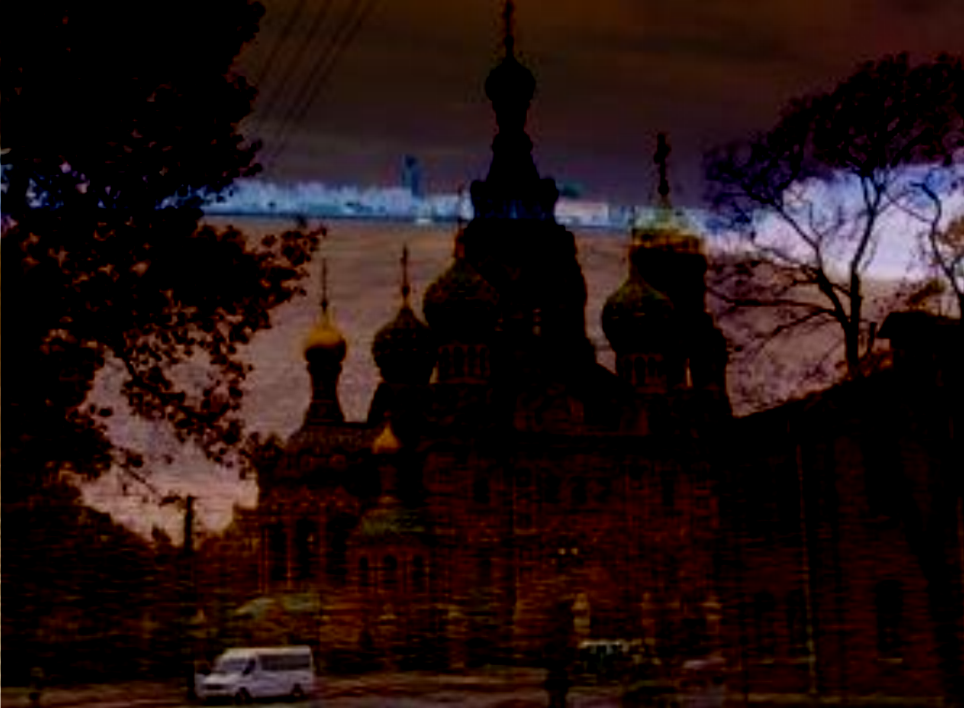

SIN OPENCV


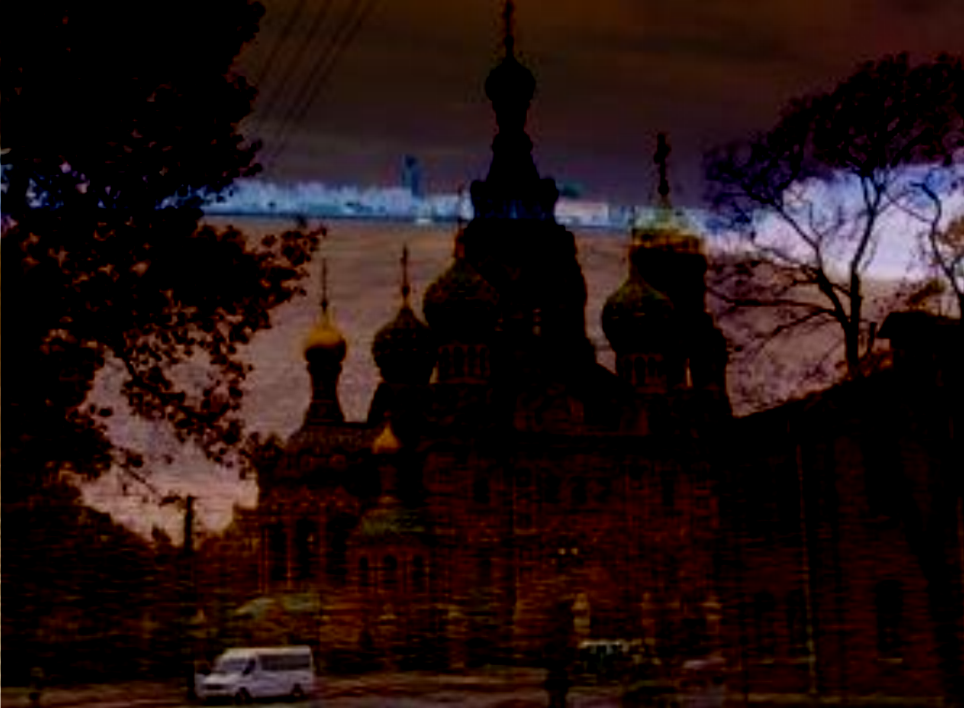

In [ ]:
def subtract_px(px_a, px_b):
  tmp = int(int(px_a) - int(px_b))
  if (tmp > 255):
    tmp = 255  
  if (tmp < 0):
    tmp = 0
  return tmp    

image = io.imread("/content/drive/My Drive/24A_H.png") 
image_1 = cv.cvtColor(image, cv.COLOR_BGR2RGB)
image = io.imread("/content/drive/My Drive/24B_H.png") 
image_2 = cv.cvtColor(image, cv.COLOR_BGR2RGB)

cv2_imshow(cv.hconcat((image_1, image_2)))

# Add the images
print('CON OPEN CV')
img = cv.subtract(image_1, image_2)
  
# Show the image
cv2_imshow(img)

print('SIN OPENCV')
add_img(image_1,image_2, subtract_px)

### R(x,y):= (A(x,y)+B(x,y))/2

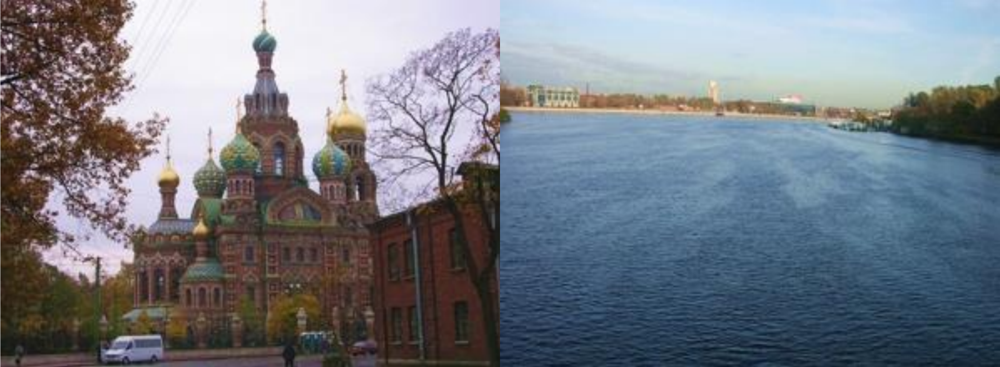

SIN OPENCV


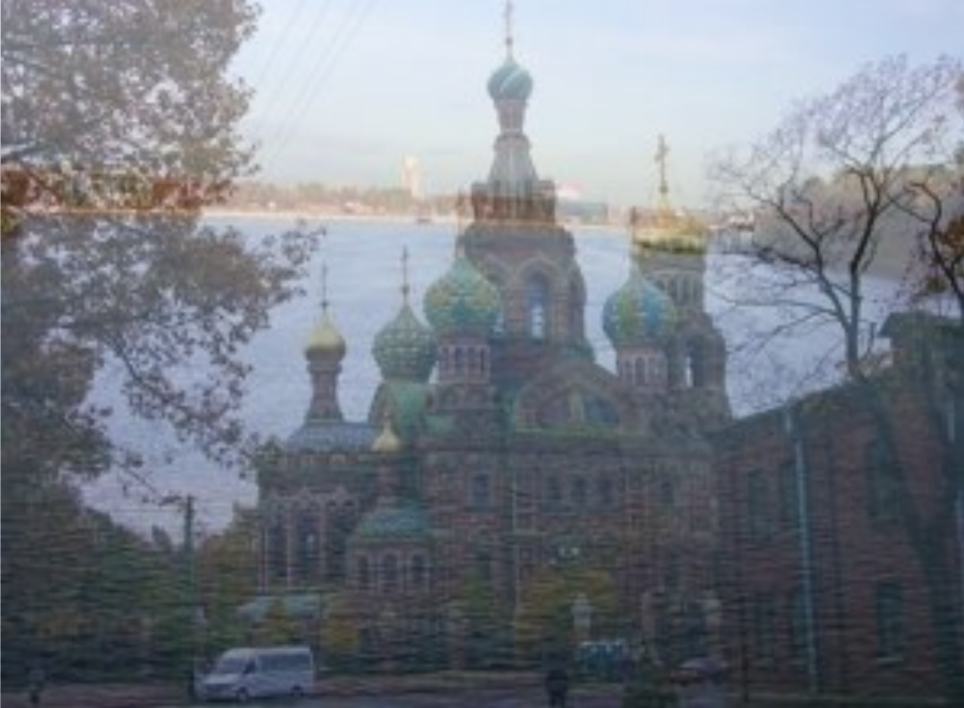

In [ ]:
def add_px_div2(px_a, px_b):
  tmp = int(int(px_a) + int(px_b))/2
  if (tmp > 255):
    tmp = 255  
  if (tmp < 0):
    tmp = 0
  return tmp    

image = io.imread("/content/drive/My Drive/24A_H.png") 
image_1 = cv.cvtColor(image, cv.COLOR_BGR2RGB)
image = io.imread("/content/drive/My Drive/24B_H.png") 
image_2 = cv.cvtColor(image, cv.COLOR_BGR2RGB)

cv2_imshow(cv.hconcat((image_1, image_2)))

print('SIN OPENCV')
add_img(image_1,image_2, add_px_div2)

### R(x,y):= a·A(x,y) + (1-a)·B(x,y)

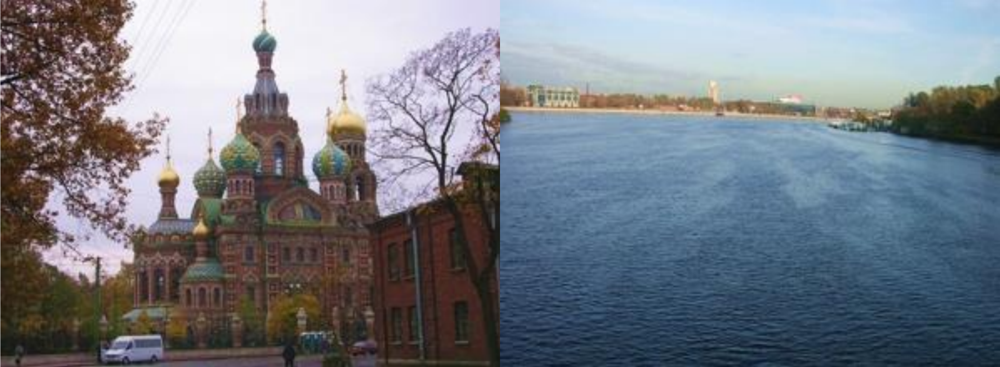

SIN OPENCV a = 0.25


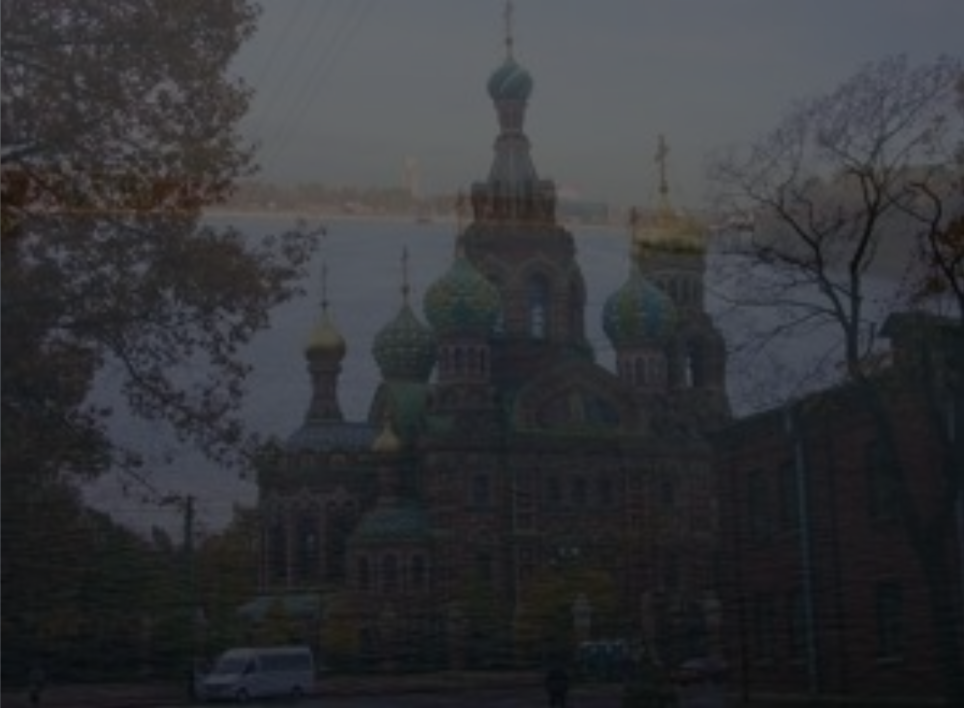

SIN OPENCV a = 0.5


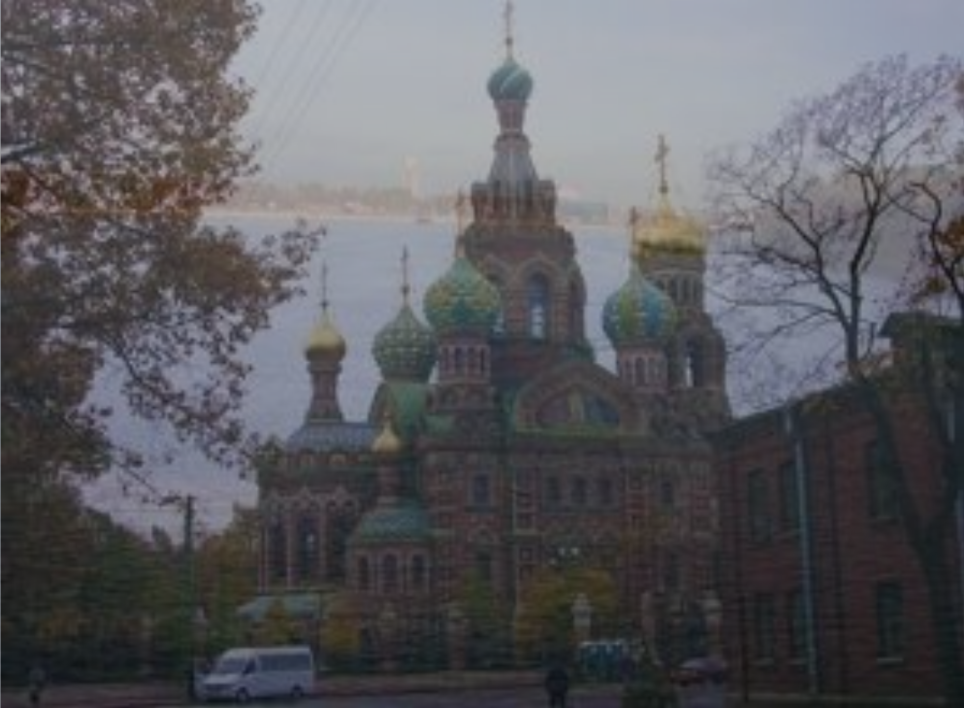

SIN OPENCV a = 0.75


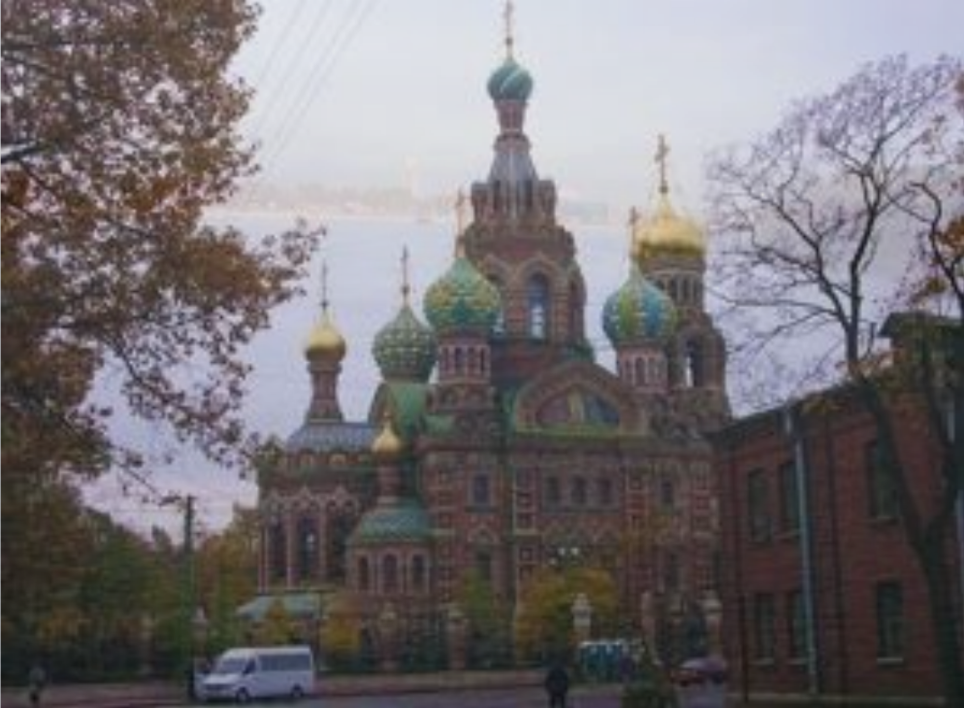

In [ ]:
a = 0.25
def add_med_ponderada(px_A, px_B):
  tmp = a*int(int(px_A) + (1-a)* int(px_B))
  if (tmp > 255):
    tmp = 255  
  if (tmp < 0):
    tmp = 0
  return tmp    

image = io.imread("/content/drive/My Drive/24A_H.png") 
image_1 = cv.cvtColor(image, cv.COLOR_BGR2RGB)
image = io.imread("/content/drive/My Drive/24B_H.png") 
image_2 = cv.cvtColor(image, cv.COLOR_BGR2RGB)

cv2_imshow(cv.hconcat((image_1, image_2)))

print('SIN OPENCV a = ' + str(a))
add_img(image_1,image_2, add_med_ponderada)
a = 0.5
print('SIN OPENCV a = ' + str(a))
add_img(image_1,image_2, add_med_ponderada)
a = 0.75
print('SIN OPENCV a = ' + str(a))
add_img(image_1,image_2, add_med_ponderada)

### R(x,y):= A(x, y)·B(x, y)·c

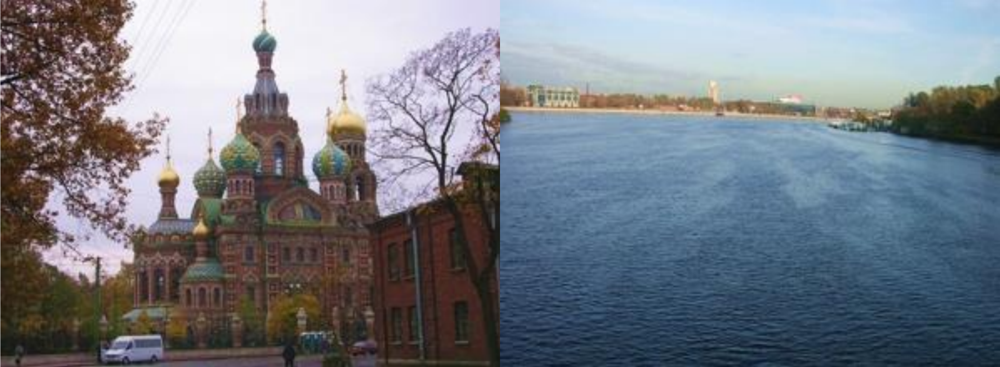

SIN OPENCV c = 0.25


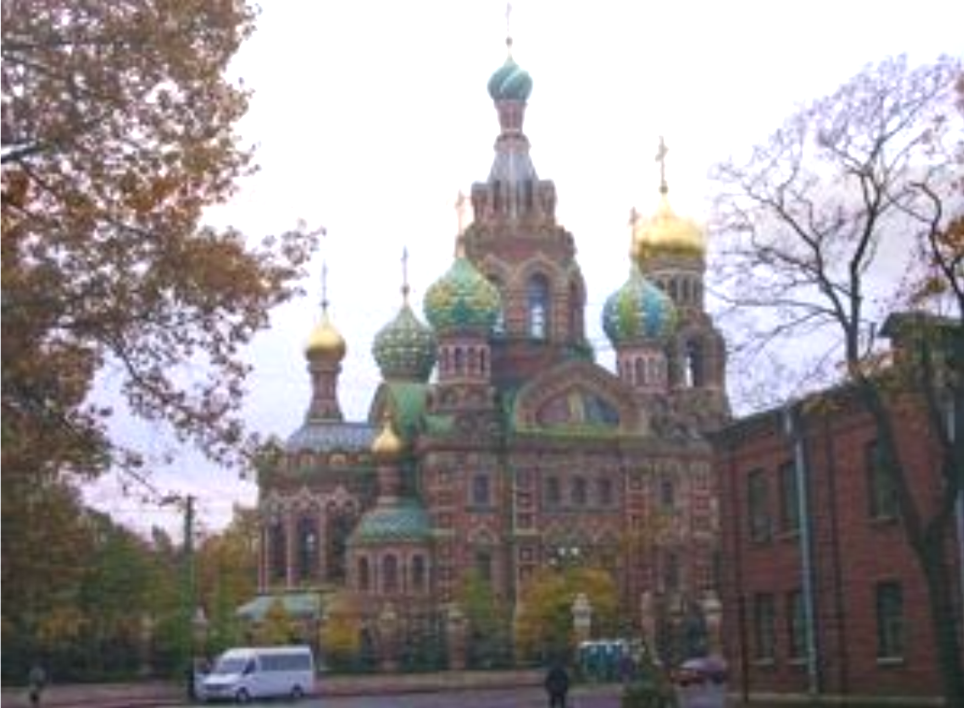

SIN OPENCV c = 0.5


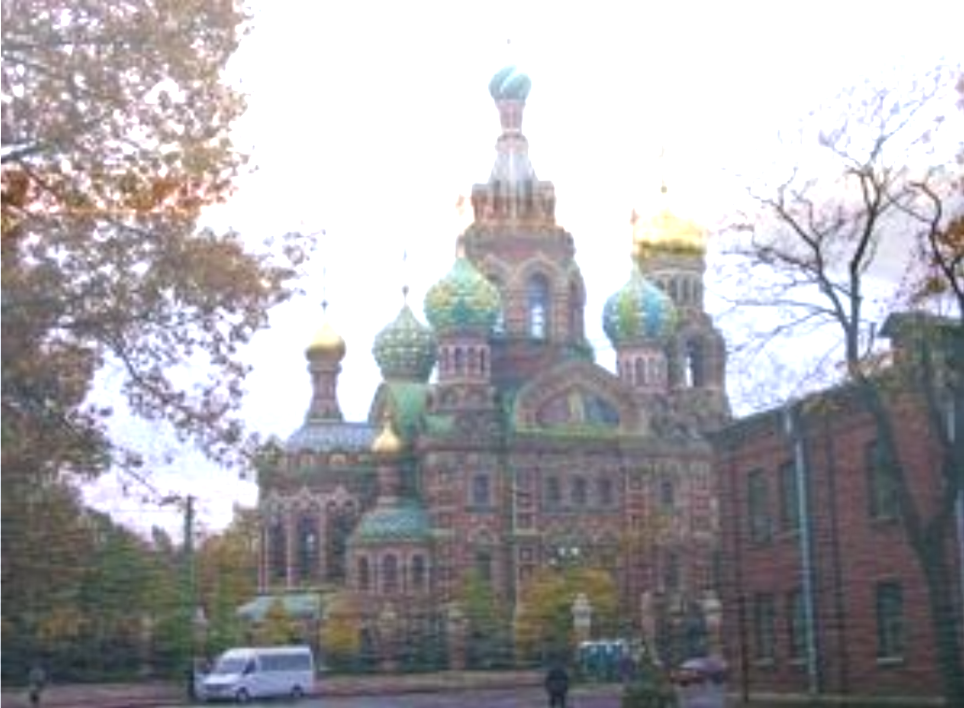

SIN OPENCV c = 0.75


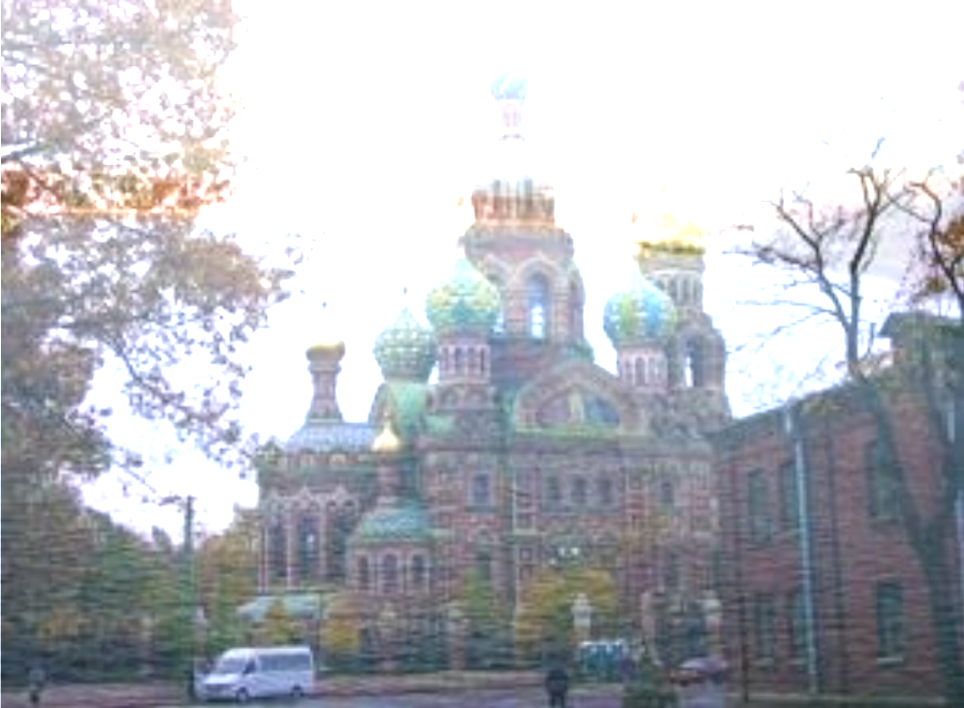

In [ ]:
c = 0.25
def add_a_b_X_c(px_A, px_B):
  tmp = int(int(px_A) + int(px_B)*c)
  if (tmp > 255):
    tmp = 255  
  if (tmp < 0):
    tmp = 0
  return tmp    

image = io.imread("/content/drive/My Drive/24A_H.png") 
image_1 = cv.cvtColor(image, cv.COLOR_BGR2RGB)
image = io.imread("/content/drive/My Drive/24B_H.png") 
image_2 = cv.cvtColor(image, cv.COLOR_BGR2RGB)

cv2_imshow(cv.hconcat((image_1, image_2)))

print('SIN OPENCV c = ' + str(c))
add_img(image_1,image_2, add_a_b_X_c)
c = 0.5
print('SIN OPENCV c = ' + str(c))
add_img(image_1,image_2, add_a_b_X_c)
c = 0.75
print('SIN OPENCV c = ' + str(c))
add_img(image_1,image_2, add_a_b_X_c)

## EJERCICIO 3: Convoluciones 



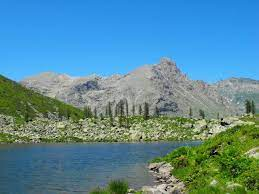

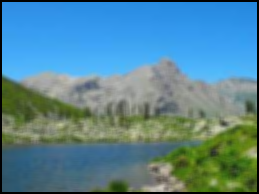

In [ ]:
# Cargar imagen
img = cv.imread('/content/drive/MyDrive/paisaje.png')

# Definir kernel
kernel = np.ones((5,5),np.float32)/25

def filter2D(image, kernel, depth):
    # Obtener la altura y el ancho de la imagen y del kernel
    height, width = image.shape[:2]
    k_height, k_width = kernel.shape[:2]

    # Calcular el borde del kernel
    k_border = k_height // 2

    # Crear una imagen de salida con la misma forma que la imagen de entrada
    output = np.zeros_like(image, dtype=np.float32)

    for c in range(image.shape[2]):
        for y in range(k_border, height - k_border):
            for x in range(k_border, width - k_border):
                # Obtener la región de la imagen correspondiente al kernel
                region = image[y-k_border:y+k_border+1, x-k_border:x+k_border+1, c]

                # Multiplicar los valores de píxel por los valores del kernel y sumar el resultado
                result = (region * kernel).sum()

                # Asignar el resultado al píxel correspondiente en la imagen de salida
                output[y, x, c] = result

    # Convertir la imagen de salida a la profundidad especificada
    output = np.clip(output, 0, 255)
    output = output.astype(np.uint8)

    # Devolver la imagen de salida
    return output


# Aplicar la función filter2D
dst = filter2D(img, kernel, -1)

# Mostrar imagen original y la imagen después de la convolución
cv2_imshow(img)
cv2_imshow(dst)

# Esperar tecla para cerrar las ventanas
cv.waitKey(0)
cv.destroyAllWindows()

Original:


nearest_neighbor_zoom:


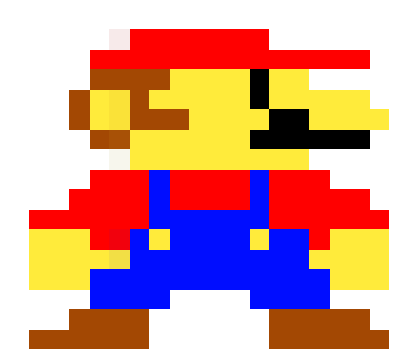

BiLinear_interpolation_zoom:


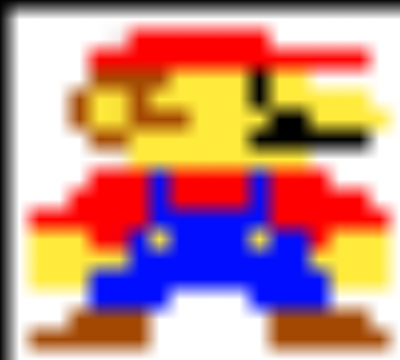

In [ ]:
from PIL import Image
import matplotlib.pyplot as plt
import numpy as np
import math


def nearest_neighbor_zoom(img,zoom):
    #print(img.shape[0])
    #print(img.shape[1])   
    height =img.shape[0] 
    width  =img.shape[1]   
    color  =img.shape[2]   
    zoomedH = height * zoom
    zoomedW = width * zoom
    
    retimg=np.zeros((zoomedH,zoomedW,color),dtype=np.uint8)
    for i in range(0, height*zoom):
        for j in range(0, width*zoom):
            scrx=round((i+1)*(height/zoomedH))
            scry=round((j+1)*(width/zoomedW))
            retimg[i,j]=img[scrx-1,scry-1]
    return retimg    


def BiLinear_interpolation_zoom(img,zoom):
    height =img.shape[0] 
    width  =img.shape[1]   
    color  =img.shape[2]  
    zoomedH = height * zoom
    zoomedW = width * zoom  

    scrH,scrW,_=img.shape
    img=np.pad(img,((0,1),(0,1),(0,0)),'constant')
    retimg=np.zeros((zoomedH,zoomedW,color),dtype=np.uint8)
    for i in range(zoomedH):
        for j in range(zoomedW):
            scrx=(i+1)*(scrH/zoomedH)-1
            scry=(j+1)*(scrW/zoomedW)-1
            x=math.floor(scrx)
            y=math.floor(scry)
            u=scrx-x
            v=scry-y
            retimg[i,j]=(1-u)*(1-v)*img[x,y]+u*(1-v)*img[x+1,y]+(1-u)*v*img[x,y+1]+u*v*img[x+1,y+1]
    return retimg


im_path='/content/drive/My Drive/8bitmario.png'
image=np.array(Image.open(im_path))
image = cv.cvtColor(image, cv.COLOR_BGR2RGB)
print('Original:')
cv2_imshow(image)

print('nearest_neighbor_zoom:')
image1=nearest_neighbor_zoom(image,20)
image1=Image.fromarray(image1.astype('uint8')).convert('RGB')
image1.save('NN_interpolation.png')
image1 = io.imread("NN_interpolation.png") 

cv2_imshow(image1)

print('BiLinear_interpolation_zoom:')
image2=BiLinear_interpolation_zoom(image, 20)
image2=Image.fromarray(image2.astype('uint8')).convert('RGB')
image2.save('BiLinear_interpolation.png')
image2 = io.imread("BiLinear_interpolation.png") 

cv2_imshow(image2)

##EJERCICIO 4: ZOOM 

##EJERCICIO 5: FILTRO MEDIANA
Solo se puede aplicar con imágenes en blanco y negro

Original:


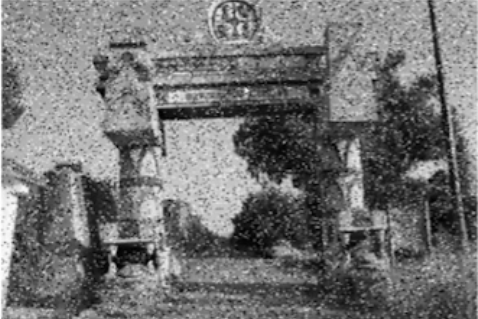

Filtro mediana aplicado:


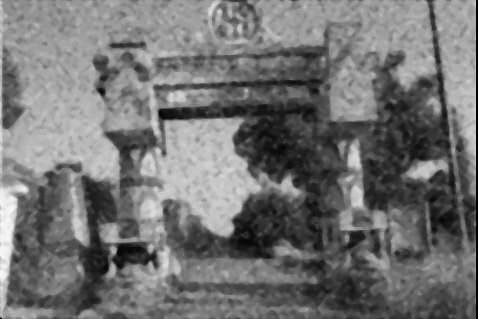

In [ ]:
def median_filter(data, filter_size):
    temp = []
    indexer = filter_size // 2
    data_final = []
    data_final = numpy.zeros((len(data),len(data[0])))
    for i in range(len(data)):

        for j in range(len(data[0])):

            for z in range(filter_size):
                if i + z - indexer < 0 or i + z - indexer > len(data) - 1:
                    for c in range(filter_size):
                        temp.append(0)
                else:
                    if j + z - indexer < 0 or j + indexer > len(data[0]) - 1:
                        temp.append(0)
                    else:
                        for k in range(filter_size):
                            temp.append(data[i + z - indexer][j + k - indexer])

            temp.sort()
            data_final[i][j] = temp[len(temp) // 2]
            temp = []
    return data_final

img_o = Image.open('/content/drive/My Drive/class_median.png').convert("L")
print("Original:")
img_o.show()
arr = numpy.array(img_o)
removed_noise = median_filter(arr,5) 
img = Image.fromarray(removed_noise)
print("Filtro mediana aplicado:")
img.show()
